The below cell contains all the constants used in rest of the codes

# Constants

In [1]:
"""
Created on Thu Feb 20 08:22:30 2020

@author: Saba
"""
BACK_BONE = 'efficientnetb5'
BATCH_SIZE = 2
Defined_CLASSES = [1]
LR = 0.0001
EPOCHS = 200

NO_TIME_STEPS = 3 #Number of Time_steps
SPLIT_MODE = [0.6, 0.8] #60% Train, (80-60)=20% Val, (100-80)=20% Test

ENCODER_WEIGHT = 'imagenet'
ENCODER_FREEZE = True
MODEL_INPUT_SHAPE = (None,None,3)

In [2]:
import keras
OPTIMIZER = keras.optimizers.Adam(LR)

Using TensorFlow backend.


In [3]:
HOME_DIR = "/home/ubuntu/"

PATH_TO_SAVE_MODEL = HOME_DIR +'/Trained_model/'

MODEL_NAME = "_POST_LSTM" # _MULTIPLICATION, _CONCAT, _PRE_LSTM, _POST_LSTM, _Nine_W_1_1_CONV, _Nine_WO_1_1_CONV, _PRE_LSTM_UNET_MUL, _PRE_LSTM_UNET_CONCAT

if ENCODER_FREEZE :
    f = 'True'
else:
    f = 'False'
    
if ENCODER_WEIGHT is None:
    w = 'None'
else:
    w = ENCODER_WEIGHT
MODEL_DESC = '{'+BACK_BONE+'}_batch_{'+str(BATCH_SIZE)+'}_epoch_{'+str(EPOCHS)+'}_time_steps_{'+str(NO_TIME_STEPS)+'}_encoder_freeze_{'+f+'}_encoder_weight_{'+w+'}{'+MODEL_NAME+'}'+'_3_2_1'
print(MODEL_DESC)
PATH_TO_INPUT = HOME_DIR + "Dataset/fields_with_masks/"

In [4]:
import tensorflow as tf
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

config =  tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.compat.v1.Session(config=config)
tf.compat.v1.keras.backend.set_session(sess)

print("TensorFlow version: {}".format(tf.__version__))
print("Eager execution: {}".format(tf.executing_eagerly()))

TensorFlow version: 1.15.2
Eager execution: False


In [5]:
import matplotlib.pyplot as plt
from io import BytesIO
import matplotlib.image as mpimg
import numpy as np
import cv2
import re

In [6]:
""" This function used to visualize the input, predicted mask and ground truth"""
def visualize(save_status, save_path,flight_code,**images ):
    
    n = len(images)
    plt.figure(figsize=(40,40))
    for i, (name , image) in enumerate(images.items()):
        plt.subplot(1, n, i+1)
        plt.xticks([])
        plt.yticks([])
        # plt.title(str(i+1))
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
        
    
    if save_status : 
        if not os.path.exists(save_path):
            os.makedirs(save_path)
        plt.savefig(save_path+flight_code+'.jpg')    
    plt.show()
   

In [7]:
def denormalize(x):
    x_max = np.max(x)
    x_min = np.min(x)
    x = (x-x_min) / (x_max - x_min)
    x = x.clip(0,1)
    return x

In [8]:
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ] 
    return sorted(data, key=alphanum_key,reverse=True)   

# Creating Dataset

In [9]:
class Dataset:
    
    CLASSES = Defined_CLASSES
    def __init__(
            self,
            field_dir,
            status, #train,test,validation
            classes = None,
            augmentation = None,
            preprocessing = None
            ):
        """ make a list of image directions  """
        files = ['bounday_mask.png','nutrient_mask.png']
        self.field_dirs = [ids for ids in sorted(os.listdir(field_dir))]
        self.field_fps = [os.path.join(field_dir ,field_id) for field_id in self.field_dirs if len(os.listdir(os.path.join(field_dir ,field_id))) >= NO_TIME_STEPS ]
        
        train, validate, test = np.split(self.field_fps, [int(SPLIT_MODE[0]*len(self.field_fps)), int(SPLIT_MODE[1]*len(self.field_fps))])
        print(len(train))
        print(len(validate))
        print(len(test))
        if status == 'train':
            self.field_fps = train
        elif status == 'validate':
            self.field_fps = validate
        elif status == 'test':
            self.field_fps = test
        
        self.field_codes            = []
        self.field_number            = []
        self.field_images            = []
        self.field_nutrient_mask     = []
        self.field_boundary_mask     = []

        for field_path in self.field_fps:
            flight_dirs = sorted_alphanumeric(os.listdir(field_path))
            codes  = []
            number = []
            images = []
            nutrient_mask = []
            boundary_mask = []

            for j in flight_dirs:
                flight_number, flight_code = j.split('_')
                codes.append(flight_code)
                number.append(flight_number)
                images.append(os.path.join(field_path,j,flight_code+'.png'))
                boundary_mask.append(os.path.join(field_path,j,files[0]))
                nutrient_mask.append(os.path.join(field_path,j,files[1]))


            self.field_codes.append(codes)
            self.field_number.append(number)
            self.field_images.append(images)
            self.field_nutrient_mask.append(nutrient_mask)
            self.field_boundary_mask.append(boundary_mask)

        
        """ set the class values and assign a augmentation and preprocessing method"""
        self.class_values = classes
        self.augmentation = augmentation
        self.preprocessing = preprocessing
        
    def __getitem__(self,i):
         
        """ read images"""
        image1 = cv2.imread(self.field_images[i][0])
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        w, h,_ = image1.shape
        
        
        image2 = cv2.imread(self.field_images[i][1])
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        image2 = cv2.resize(image2, (h,w) , interpolation = cv2.INTER_AREA)
        
        
        image3 = cv2.imread(self.field_images[i][2])
        image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)
        image3 = cv2.resize(image3, (h,w), interpolation = cv2.INTER_AREA)
        
        
        boundary_mask = cv2.imread(self.field_boundary_mask[i][0])
        boundary_mask = cv2.cvtColor(boundary_mask, cv2.COLOR_BGR2GRAY)
        
        
        nutrient_mask = cv2.imread(self.field_nutrient_mask[i][0])
        nutrient_mask = cv2.cvtColor(nutrient_mask, cv2.COLOR_BGR2GRAY) 
        
        boundary_mask = denormalize(boundary_mask)
        nutrient_mask = denormalize(nutrient_mask)
        
        """ extract certain classes from mask 1 """
        masks = [(boundary_mask == v) for v in self.class_values]
        boundary_mask = np.stack(masks, axis = -1).astype('float')
        
        boundary_mask_for_slic = np.stack(masks, axis = 0).astype('float')
        
        masks = [(nutrient_mask == v) for v in self.class_values]
        nutrient_mask = np.stack(masks, axis = -1).astype('float')
        
        data1 = {"image": image1,"image2": image2, "image3": image3, "mask": nutrient_mask }
        """ apply augmentation """
        if self.augmentation:
            sample = self.augmentation(**data1)
            image1 , nutrient_mask, image2, image3 = sample['image'], sample['mask'], sample['image2'], sample['image3'] 
         
        data2 = {"image": image1,"image2": image2, "image3": image3, "mask": nutrient_mask }
        """ apply preprocessing """
        if self.preprocessing:
            sample = self.preprocessing(**data2)
            image1 , nutrient_mask,image2,image3 = sample['image'], sample['mask'], sample['image2'],sample['image3']
        
        return image1, image2, image3,nutrient_mask, boundary_mask,self.field_codes[i][0] 
    
    def __len__(self):
        return len(self.field_images)
    

## Dataloader

In [10]:
class Dataloader(keras.utils.Sequence):
    
    def __init__(
            self,
            dataset,
            batch_size = 1,
            shuffle = False
            ):
        
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))
        
        self.on_epoch_end()
        
    def __getitem__(self, i):
        
        start = i * self.batch_size
        stop = (i+1) * self.batch_size
        data1 = []
        data2 = []
        data3 = []
        masks = []
        data_concat = []
        data_stack = []
        masks_stack = []
        for j in range(start, stop):
            im1,im2,im3,mask,_,_ = self.dataset[j]
            data1.append(im1)
            data2.append(im2)
            data3.append(im3)
            masks.append(mask)
            
            im1,im2,im3,mask,_,_ = self.dataset[j]
            image_concat = np.concatenate((im1,im2,im3),axis =2)
            data_concat.append((image_concat,mask))
            
            image_stack = np.stack((im3,im2,im1),axis=0)
            #m_stack = np.stack((mask,mask,mask),axis=0)
            m_stack = np.expand_dims(mask,axis = 0)
            data_stack.append(image_stack)
            masks_stack.append(m_stack)
        
        if MODEL_NAME == '_Nine_W_1_1_CONV' or MODEL_NAME == '_Nine_WO_1_1_CONV':
            batch = [np.stack(samples, axis = 0) for samples in zip(*data_concat)]
            return batch
        elif MODEL_NAME == '_PRE_LSTM' or MODEL_NAME == '_POST_LSTM':
            #batch = [np.stack(samples, axis = 0) for samples in zip(*data_stack)]
            return [np.array(data_stack)],[np.array(masks_stack),np.array(masks_stack),np.array(masks_stack)]
        else:
            return [np.array(data1),np.array(data2),np.array(data3)],[np.array(masks),np.array(masks),np.array(masks)]
    
    def __len__(self):
        """  the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)            

# Do Data Augmentation

In [11]:
import albumentations as A


def round_clip_0_1(x, **kwargs):
    return x.round

def training_augmentation():
        train_transform = [
            A.HorizontalFlip(p = 0.5),
            A.VerticalFlip(p=0.5),
            A.ShiftScaleRotate(scale_limit = 0.5, rotate_limit=0, shift_limit = 0.1, p = 1, border_mode=0),
            A.PadIfNeeded(min_height = 512, min_width = 512, always_apply= True, border_mode=0),
            #A.RandomCrop(height=512, width=512, always_apply = True),
#             A.CropNonEmptyMaskIfExists(height=512, width=512,p=1),
            #A.RandomResizedCrop(height, width, scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=1, always_apply=False, p=1.0)
            
            A.IAAAdditiveGaussianNoise(p=0.2),
            A.IAAPerspective(p=0.5),
            
            A.OneOf(
                [
                    A.CropNonEmptyMaskIfExists(height=512, width=512,p=0.5),
                    A.Resize(height=512, width=512, interpolation=1, p=0.5),
                ],
                p = 1,
            ),
            A.OneOf(
               [
                   A.CLAHE(p=1),
                   A.RandomBrightness(p=1),
                   A.RandomGamma(p=1),
               ],
               p=0.9,
            ),

            A.OneOf(
               [
                   A.IAASharpen(p=1),
                   A.Blur(blur_limit=3, p=1),
                   A.MotionBlur(blur_limit=3, p=1),
               ],
               p=0.9,
            ),

            A.OneOf(
               [
                   A.RandomContrast(p=1),
                   A.HueSaturationValue(p=1),
               ],
               p=0.9,
           ),
            # A.Lambda(mask = round_clip_0_1)
            #A.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, always_apply=False, p=0.5)
        ]
    
        return A.Compose(train_transform,
            additional_targets={"image2" : "image", "image3":"image"})

def validation_augmentation():
    test_transform = [
        A.PadIfNeeded(min_height = 512, min_width = 512, always_apply= True, border_mode=0),
#         A.CropNonEmptyMaskIfExists(height=512, width=512, always_apply=True)
        A.OneOf(
                [
                    A.CropNonEmptyMaskIfExists(height=512, width=512,p=0.5),
                    A.Resize(height=512, width=512, interpolation=1, p=0.5),
                ],
                p = 1,
            ),
        #A.RandomCrop(height=512, width=512, always_apply = True)
        #A.Resize(height=1024, width=1024, interpolation=1, always_apply=True, p=1)
        ]
    return A.Compose(test_transform,additional_targets={"image2" : "image", "image3":"image"})

def get_preprocessing(preprocessing_fn):
    
    _transform = [
        A.Lambda(image = preprocessing_fn),
        ]
    return A.Compose(_transform,additional_targets={"image2" : "image", "image3":"image"})

# Model Settings

In [12]:
import segmentation_models as sm
import numpy as np
import keras
import matplotlib.pyplot as plt
from keras.models import Model
from keras.layers import Input, Conv2D, Concatenate, Multiply
from keras.layers import BatchNormalization, ConvLSTM2D, Conv3D, Lambda, Reshape
import keras.backend as K
#from tensorflow import slice

""" define preprocess method condisering back_bone"""
preprocess_input = sm.get_preprocessing(BACK_BONE)
""" model parameters"""
n_classes = 1 if len(Defined_CLASSES)== 1 else (len(Defined_CLASSES)+1)
activation = 'sigmoid' if n_classes == 1 else 'softmax'

  

Segmentation Models: using `keras` framework.


In [13]:
"""creating a model"""

class MyModels():
    def _Nine_WO_1_1_CONV(self):
        final_model = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape=(None,None,9), encoder_weights=None,encoder_freeze = ENCODER_FREEZE)
        return final_model
    def _Nine_W_1_1_CONV(self):
        model = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        
        model.layers.pop(0)
        newInputs = Input(shape=(None,None,9))
        x = Conv2D(3, kernel_size=(1,1))(newInputs)
        newOutputs = model(x)
        final_model = Model(newInputs, newOutputs)
        
        return final_model
        
    def _MULTIPLICATION(self):
        model_1 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_2 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_3 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        
        input_1 = Input(shape=(512,512,3), name='input_1')
        input_2 = Input(shape=(512,512,3), name='input_2')
        input_3 = Input(shape=(512,512,3), name='input_3')

        x3 = Model(model_1.input, model_1.output, name='model_3')(input_3)
        p = Concatenate(axis=3)([x3,x3,x3])

        input_2_new =Multiply()([input_2, p])

        x2 = Model(model_2.input, model_2.output, name='model_2')(input_2_new)
        p = Concatenate(axis=3)([x2,x2,x2])

        input_1_new =Multiply()([input_1, p])

        x1 = Model(model_3.input, model_3.output , name='model_1')(input_1_new)

        final_model = Model(inputs =[input_1,input_2,input_3],outputs=[x3,x2,x1])

        return final_model
    
    def _CONCAT(self):
        model_1 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_2 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_3 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        
        input_1 = Input(shape=(512,512,3), name='input_1')
        input_2 = Input(shape=(512,512,3), name='input_2')
        input_3 = Input(shape=(512,512,3), name='input_3')

        x3 = Model(model_1.input, model_1.output, name='model_3')(input_3)
        
        input_2_new =Concatenate(axis=3)([x3, input_2])
        x2 = Model(model_2.input, model_2.output, name='model_2')(input_2_new)

        input_1_new =Concatenate(axis=3)([x2, input_1])
        x1 = Model(model_3.input, model_3.output , name='model_1')(input_1_new)

        final_model = Model(inputs =[input_1,input_2,input_3],outputs=[x3,x2,x1])

        return final_model
    def _PRE_LSTM(self):
#         model_1 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
#         model_2 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
#         model_3 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        
        input_1 = Input(shape=(3,512,512,3), name='input')

        
        #new_input = stack((input_3,input_2,input_1), axis=1)

        x = ConvLSTM2D(filters=40, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(input_1)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=40, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=40, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=40, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = Conv3D( filters=1, kernel_size=(3, 3, 3),data_format='channels_last', activation="sigmoid", padding="same", name = 'output')(x)
#         x3 = Model(model_1.input, model_1.output, name='model_3')(input_3)
#         x2 = Model(model_2.input, model_2.output, name='model_2')(input_2_new)
#         p = Concatenate(axis=3)([x2,x2,x2])

#         input_1_new =Multiply()([input_1, p])

#         x1 = Model(model_3.input, model_3.output , name='model_1')(input_1_new)

        final_model = Model(input_1,x, name = 'hello')

        return final_model
    
    def _POST_LSTM(self):
        model_1 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_2 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        model_3 = sm.Unet(BACK_BONE, classes = n_classes, activation = activation,input_shape = MODEL_INPUT_SHAPE, encoder_weights='imagenet',encoder_freeze = ENCODER_FREEZE)
        
#         input_1 = Input(shape=(512,512,3), name='input_1')
#         input_2 = Input(shape=(512,512,3), name='input_2')
#         input_3 = Input(shape=(512,512,3), name='input_3')
        combined_input = Input(shape=(3,512,512,3), name='input')
        input_3 = Lambda( lambda x: tf.slice(x, (0,0, 0, 0,0), (-1,1,-1, -1, -1)))(combined_input)
        input_2 = Lambda( lambda x: tf.slice(x, (0,1, 0, 0,0), (-1,1,-1, -1, -1)))(combined_input)
        input_1 = Lambda( lambda x: tf.slice(x, (0,2, 0, 0,0), (-1,1,-1, -1, -1)))(combined_input)
        
        input_1 = Reshape((512,512,3))(input_1)
        input_2 = Reshape((512,512,3))(input_2)
        input_3 = Reshape((512,512,3))(input_3)
        

        x3 = Model(model_1.input, model_1.output)(input_3)

        x2 = Model(model_2.input, model_2.output)(input_2)
        
        x1 = Model(model_3.input, model_3.output)(input_1)
        
        new_input = Lambda(lambda x: K.stack([x[0], x[1],x[2]], axis=1))([x3, x2,x1])
        
        x = ConvLSTM2D(filters=4, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(new_input)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=4, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=4, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = ConvLSTM2D(filters=4, kernel_size=(3, 3),data_format='channels_last', padding="same", return_sequences=True)(x)
        x = BatchNormalization()(x)
        x = Conv3D( filters=1, kernel_size=(3, 3, 3),data_format='channels_last', activation="sigmoid", padding="same", name = 'output')(x)

        x3 = Lambda( lambda x: tf.slice(x, (0,0, 0, 0,0), (-1,1,-1, -1, -1)), name= 'model_3')(x)
        x2 = Lambda( lambda x: tf.slice(x, (0,1, 0, 0,0), (-1,1,-1, -1, -1)), name = 'model_2')(x)
        x1 = Lambda( lambda x: tf.slice(x, (0,2, 0, 0,0), (-1,1,-1, -1, -1)), name='model_1')(x)


        final_model = Model(inputs=combined_input,outputs=[x3,x2,x1])

        return final_model
    

In [14]:
my_cls = MyModels()
model = getattr(my_cls, MODEL_NAME)()
model.summary()












Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              (None, 3, 512, 512,  0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 1, 512, 512,  0           input[0][0]                      
__________________________________________________________________________________________________
lambda_2 (Lambda)               (None, 1, 512, 512,  0           input[0][0]                      
__________________________________________________________________________________________________
lambda_3 (Lambda)               (None, 1, 512, 512,  0           input[0][0]    

In [15]:
""" defining loss function and metrics"""
#dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.1,0.3,0.7,0.9])) 
#focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
#total_loss = dice_loss + (1 * focal_loss)
total_loss = sm.losses.binary_focal_dice_loss
losses = {
    "model_3": total_loss,
    "model_2": total_loss,
    "model_1": total_loss,
}
metrics = [sm.metrics.IOUScore(threshold =0.5), sm.metrics.FScore(threshold = 0.5), sm.metrics.Precision(threshold = 0.5),sm.metrics.Recall(threshold = 0.5) ]

""" compiling the network """
model.compile(OPTIMIZER, losses, metrics)

In [16]:
""" loading traind and validation dataset """
train_dataset = Dataset(PATH_TO_INPUT,
                        status = 'train',
                           classes = Defined_CLASSES,
                           augmentation = training_augmentation(),
                           preprocessing = get_preprocessing(preprocess_input),
                           )

valid_dataset = Dataset(PATH_TO_INPUT,
                        status = 'validate',
                           classes = Defined_CLASSES,
                           augmentation = training_augmentation(),
                           preprocessing = get_preprocessing(preprocess_input),
                           )

train_dataloader = Dataloader(train_dataset, batch_size = BATCH_SIZE, shuffle = True )
valid_dataloader = Dataloader(valid_dataset, batch_size = 1, shuffle = False )

231
77
78
231
77
78


## Train the MODEL

In [17]:
""" define callbacks  for learning rate scheduling and best checkpoints """

callbacks = [
    keras.callbacks.ModelCheckpoint(PATH_TO_SAVE_MODEL+MODEL_DESC+'.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
    ]

history = model.fit_generator(
    train_dataloader,
    steps_per_epoch = len(train_dataloader),
    epochs = EPOCHS,
    callbacks = callbacks,
    validation_data=valid_dataloader, 
    validation_steps=len(valid_dataloader),
    )


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/200
 29/115 [======>.......................] - ETA: 14:15 - loss: 3.3054 - model_3_loss: 1.0290 - model_2_loss: 1.0770 - model_1_loss: 1.1994 - model_3_iou_score: 0.0554 - model_3_f1-score: 0.0973 - model_3_precision: 0.0743 - model_3_recall: 0.5713 - model_2_iou_score: 0.0543 - model_2_f1-score: 0.0954 - model_2_precision: 0.0689 - model_2_recall: 0.6060 - model_1_iou_score: 0.0526 - model_1_f1-score: 0.0918 - model_1_precision: 0.0589 - model_1_recall: 0.7241

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in true_divide


115/115 [==============================] - 411s 4s/step - loss: 3.1765 - model_3_loss: 1.0191 - model_2_loss: 1.0144 - model_1_loss: 1.1429 - model_3_iou_score: 0.0552 - model_3_f1-score: 0.0970 - model_3_precision: 0.0778 - model_3_recall: 0.5815 - model_2_iou_score: 0.0457 - model_2_f1-score: 0.0812 - model_2_precision: 0.0772 - model_2_recall: 0.4949 - model_1_iou_score: 0.0654 - model_1_f1-score: 0.1095 - model_1_precision: 0.0717 - model_1_recall: 0.7948 - val_loss: 3.1125 - val_model_3_loss: 1.0104 - val_model_2_loss: 0.9964 - val_model_1_loss: 1.1057 - val_model_3_iou_score: 0.0306 - val_model_3_f1-score: 0.0459 - val_model_3_precision: 0.0665 - val_model_3_recall: 0.6462 - val_model_2_iou_score: 0.0557 - val_model_2_f1-score: 0.0720 - val_model_2_precision: 0.1016 - val_model_2_recall: 0.6411 - val_model_1_iou_score: 0.0529 - val_model_1_f1-score: 0.0826 - val_model_1_precision: 0.0611 - val_model_1_recall: 0.9062
Epoch 2/200
115/115 [==============================] - 119s 1s/s

Epoch 10/200
115/115 [==============================] - 118s 1s/step - loss: 2.6633 - model_3_loss: 0.9139 - model_2_loss: 0.8616 - model_1_loss: 0.8878 - model_3_iou_score: 0.2384 - model_3_f1-score: 0.2937 - model_3_precision: 0.4163 - model_3_recall: 0.5153 - model_2_iou_score: 0.2800 - model_2_f1-score: 0.3523 - model_2_precision: 0.3968 - model_2_recall: 0.6677 - model_1_iou_score: 0.2785 - model_1_f1-score: 0.3512 - model_1_precision: 0.3917 - model_1_recall: 0.6716 - val_loss: 2.8571 - val_model_3_loss: 0.9603 - val_model_2_loss: 0.9464 - val_model_1_loss: 0.9504 - val_model_3_iou_score: 0.5276 - val_model_3_f1-score: 0.5455 - val_model_3_precision: 0.7535 - val_model_3_recall: 0.6834 - val_model_2_iou_score: 0.5460 - val_model_2_f1-score: 0.5734 - val_model_2_precision: 0.7385 - val_model_2_recall: 0.7437 - val_model_1_iou_score: 0.5452 - val_model_1_f1-score: 0.5727 - val_model_1_precision: 0.7368 - val_model_1_recall: 0.7450
Epoch 11/200
115/115 [=============================

Epoch 19/200
115/115 [==============================] - 118s 1s/step - loss: 2.4698 - model_3_loss: 0.8618 - model_2_loss: 0.7981 - model_1_loss: 0.8100 - model_3_iou_score: 0.2445 - model_3_f1-score: 0.3174 - model_3_precision: 0.3776 - model_3_recall: 0.6041 - model_2_iou_score: 0.3115 - model_2_f1-score: 0.3936 - model_2_precision: 0.4476 - model_2_recall: 0.6842 - model_1_iou_score: 0.3123 - model_1_f1-score: 0.3944 - model_1_precision: 0.4479 - model_1_recall: 0.6842 - val_loss: 2.7982 - val_model_3_loss: 0.9520 - val_model_2_loss: 0.9229 - val_model_1_loss: 0.9233 - val_model_3_iou_score: 0.5205 - val_model_3_f1-score: 0.5394 - val_model_3_precision: 0.7598 - val_model_3_recall: 0.6695 - val_model_2_iou_score: 0.5508 - val_model_2_f1-score: 0.5824 - val_model_2_precision: 0.7328 - val_model_2_recall: 0.7408 - val_model_1_iou_score: 0.5549 - val_model_1_f1-score: 0.5862 - val_model_1_precision: 0.7386 - val_model_1_recall: 0.7391
Epoch 20/200
115/115 [=============================

Epoch 28/200
115/115 [==============================] - 119s 1s/step - loss: 2.4393 - model_3_loss: 0.8556 - model_2_loss: 0.7898 - model_1_loss: 0.7939 - model_3_iou_score: 0.2731 - model_3_f1-score: 0.3438 - model_3_precision: 0.4164 - model_3_recall: 0.6032 - model_2_iou_score: 0.3339 - model_2_f1-score: 0.4147 - model_2_precision: 0.4764 - model_2_recall: 0.6855 - model_1_iou_score: 0.3381 - model_1_f1-score: 0.4186 - model_1_precision: 0.4812 - model_1_recall: 0.6849 - val_loss: 2.7752 - val_model_3_loss: 0.9488 - val_model_2_loss: 0.9132 - val_model_1_loss: 0.9132 - val_model_3_iou_score: 0.4539 - val_model_3_f1-score: 0.4800 - val_model_3_precision: 0.6381 - val_model_3_recall: 0.6895 - val_model_2_iou_score: 0.5353 - val_model_2_f1-score: 0.5697 - val_model_2_precision: 0.7183 - val_model_2_recall: 0.7372 - val_model_1_iou_score: 0.5357 - val_model_1_f1-score: 0.5696 - val_model_1_precision: 0.7198 - val_model_1_recall: 0.7361
Epoch 29/200
115/115 [=============================

Epoch 37/200
115/115 [==============================] - 119s 1s/step - loss: 2.3715 - model_3_loss: 0.8337 - model_2_loss: 0.7676 - model_1_loss: 0.7703 - model_3_iou_score: 0.2643 - model_3_f1-score: 0.3402 - model_3_precision: 0.4070 - model_3_recall: 0.6072 - model_2_iou_score: 0.3295 - model_2_f1-score: 0.4160 - model_2_precision: 0.4767 - model_2_recall: 0.6852 - model_1_iou_score: 0.3335 - model_1_f1-score: 0.4195 - model_1_precision: 0.4826 - model_1_recall: 0.6845 - val_loss: 2.7286 - val_model_3_loss: 0.9339 - val_model_2_loss: 0.8966 - val_model_1_loss: 0.8981 - val_model_3_iou_score: 0.4810 - val_model_3_f1-score: 0.5108 - val_model_3_precision: 0.6722 - val_model_3_recall: 0.7106 - val_model_2_iou_score: 0.5518 - val_model_2_f1-score: 0.5875 - val_model_2_precision: 0.7187 - val_model_2_recall: 0.7586 - val_model_1_iou_score: 0.5601 - val_model_1_f1-score: 0.5952 - val_model_1_precision: 0.7312 - val_model_1_recall: 0.7564
Epoch 38/200
115/115 [=============================

Epoch 46/200
115/115 [==============================] - 119s 1s/step - loss: 2.4001 - model_3_loss: 0.8419 - model_2_loss: 0.7779 - model_1_loss: 0.7804 - model_3_iou_score: 0.2568 - model_3_f1-score: 0.3298 - model_3_precision: 0.3983 - model_3_recall: 0.6133 - model_2_iou_score: 0.3237 - model_2_f1-score: 0.4063 - model_2_precision: 0.4649 - model_2_recall: 0.6927 - model_1_iou_score: 0.3273 - model_1_f1-score: 0.4098 - model_1_precision: 0.4699 - model_1_recall: 0.6932 - val_loss: 2.7516 - val_model_3_loss: 0.9442 - val_model_2_loss: 0.9024 - val_model_1_loss: 0.9049 - val_model_3_iou_score: 0.4868 - val_model_3_f1-score: 0.5114 - val_model_3_precision: 0.6820 - val_model_3_recall: 0.6890 - val_model_2_iou_score: 0.5559 - val_model_2_f1-score: 0.5908 - val_model_2_precision: 0.7336 - val_model_2_recall: 0.7445 - val_model_1_iou_score: 0.5572 - val_model_1_f1-score: 0.5913 - val_model_1_precision: 0.7390 - val_model_1_recall: 0.7405
Epoch 47/200
115/115 [=============================

Epoch 55/200
115/115 [==============================] - 120s 1s/step - loss: 2.3650 - model_3_loss: 0.8313 - model_2_loss: 0.7655 - model_1_loss: 0.7682 - model_3_iou_score: 0.2816 - model_3_f1-score: 0.3579 - model_3_precision: 0.4248 - model_3_recall: 0.5970 - model_2_iou_score: 0.3499 - model_2_f1-score: 0.4361 - model_2_precision: 0.4963 - model_2_recall: 0.6808 - model_1_iou_score: 0.3518 - model_1_f1-score: 0.4380 - model_1_precision: 0.5001 - model_1_recall: 0.6802 - val_loss: 2.7515 - val_model_3_loss: 0.9454 - val_model_2_loss: 0.9020 - val_model_1_loss: 0.9042 - val_model_3_iou_score: 0.5162 - val_model_3_f1-score: 0.5401 - val_model_3_precision: 0.7299 - val_model_3_recall: 0.6839 - val_model_2_iou_score: 0.5827 - val_model_2_f1-score: 0.6167 - val_model_2_precision: 0.7658 - val_model_2_recall: 0.7459 - val_model_1_iou_score: 0.5869 - val_model_1_f1-score: 0.6201 - val_model_1_precision: 0.7731 - val_model_1_recall: 0.7406
Epoch 56/200
115/115 [=============================

Epoch 64/200
115/115 [==============================] - 119s 1s/step - loss: 2.4298 - model_3_loss: 0.8474 - model_2_loss: 0.7901 - model_1_loss: 0.7923 - model_3_iou_score: 0.2681 - model_3_f1-score: 0.3377 - model_3_precision: 0.3917 - model_3_recall: 0.6316 - model_2_iou_score: 0.3335 - model_2_f1-score: 0.4125 - model_2_precision: 0.4624 - model_2_recall: 0.7003 - model_1_iou_score: 0.3364 - model_1_f1-score: 0.4153 - model_1_precision: 0.4659 - model_1_recall: 0.7015 - val_loss: 2.7577 - val_model_3_loss: 0.9469 - val_model_2_loss: 0.9047 - val_model_1_loss: 0.9061 - val_model_3_iou_score: 0.4709 - val_model_3_f1-score: 0.4964 - val_model_3_precision: 0.6642 - val_model_3_recall: 0.7026 - val_model_2_iou_score: 0.5466 - val_model_2_f1-score: 0.5802 - val_model_2_precision: 0.7302 - val_model_2_recall: 0.7487 - val_model_1_iou_score: 0.5460 - val_model_1_f1-score: 0.5791 - val_model_1_precision: 0.7333 - val_model_1_recall: 0.7465
Epoch 65/200
115/115 [=============================

Epoch 73/200
115/115 [==============================] - 120s 1s/step - loss: 2.3608 - model_3_loss: 0.8310 - model_2_loss: 0.7636 - model_1_loss: 0.7662 - model_3_iou_score: 0.2622 - model_3_f1-score: 0.3384 - model_3_precision: 0.3930 - model_3_recall: 0.6076 - model_2_iou_score: 0.3348 - model_2_f1-score: 0.4196 - model_2_precision: 0.4780 - model_2_recall: 0.6807 - model_1_iou_score: 0.3359 - model_1_f1-score: 0.4205 - model_1_precision: 0.4792 - model_1_recall: 0.6805 - val_loss: 2.7269 - val_model_3_loss: 0.9325 - val_model_2_loss: 0.8968 - val_model_1_loss: 0.8976 - val_model_3_iou_score: 0.4786 - val_model_3_f1-score: 0.5069 - val_model_3_precision: 0.6720 - val_model_3_recall: 0.6866 - val_model_2_iou_score: 0.5373 - val_model_2_f1-score: 0.5748 - val_model_2_precision: 0.7169 - val_model_2_recall: 0.7456 - val_model_1_iou_score: 0.5380 - val_model_1_f1-score: 0.5750 - val_model_1_precision: 0.7210 - val_model_1_recall: 0.7427
Epoch 74/200
115/115 [=============================

Epoch 82/200
115/115 [==============================] - 120s 1s/step - loss: 2.3739 - model_3_loss: 0.8334 - model_2_loss: 0.7689 - model_1_loss: 0.7715 - model_3_iou_score: 0.2795 - model_3_f1-score: 0.3564 - model_3_precision: 0.4218 - model_3_recall: 0.6211 - model_2_iou_score: 0.3426 - model_2_f1-score: 0.4285 - model_2_precision: 0.4917 - model_2_recall: 0.6922 - model_1_iou_score: 0.3448 - model_1_f1-score: 0.4305 - model_1_precision: 0.4945 - model_1_recall: 0.6935 - val_loss: 2.7349 - val_model_3_loss: 0.9349 - val_model_2_loss: 0.8997 - val_model_1_loss: 0.9003 - val_model_3_iou_score: 0.4771 - val_model_3_f1-score: 0.5048 - val_model_3_precision: 0.6586 - val_model_3_recall: 0.7062 - val_model_2_iou_score: 0.5620 - val_model_2_f1-score: 0.5972 - val_model_2_precision: 0.7398 - val_model_2_recall: 0.7517 - val_model_1_iou_score: 0.5652 - val_model_1_f1-score: 0.5998 - val_model_1_precision: 0.7456 - val_model_1_recall: 0.7500
Epoch 83/200
115/115 [=============================

Epoch 91/200
115/115 [==============================] - 120s 1s/step - loss: 2.3556 - model_3_loss: 0.8311 - model_2_loss: 0.7605 - model_1_loss: 0.7640 - model_3_iou_score: 0.2774 - model_3_f1-score: 0.3532 - model_3_precision: 0.4067 - model_3_recall: 0.6166 - model_2_iou_score: 0.3492 - model_2_f1-score: 0.4338 - model_2_precision: 0.4870 - model_2_recall: 0.6950 - model_1_iou_score: 0.3501 - model_1_f1-score: 0.4346 - model_1_precision: 0.4881 - model_1_recall: 0.6951 - val_loss: 2.7380 - val_model_3_loss: 0.9377 - val_model_2_loss: 0.8995 - val_model_1_loss: 0.9008 - val_model_3_iou_score: 0.4498 - val_model_3_f1-score: 0.4800 - val_model_3_precision: 0.6250 - val_model_3_recall: 0.7015 - val_model_2_iou_score: 0.5274 - val_model_2_f1-score: 0.5646 - val_model_2_precision: 0.6834 - val_model_2_recall: 0.7632 - val_model_1_iou_score: 0.5287 - val_model_1_f1-score: 0.5655 - val_model_1_precision: 0.6879 - val_model_1_recall: 0.7593
Epoch 92/200
115/115 [=============================

Epoch 100/200
115/115 [==============================] - 120s 1s/step - loss: 2.3419 - model_3_loss: 0.8249 - model_2_loss: 0.7569 - model_1_loss: 0.7602 - model_3_iou_score: 0.2900 - model_3_f1-score: 0.3637 - model_3_precision: 0.4212 - model_3_recall: 0.6376 - model_2_iou_score: 0.3616 - model_2_f1-score: 0.4441 - model_2_precision: 0.4938 - model_2_recall: 0.7165 - model_1_iou_score: 0.3637 - model_1_f1-score: 0.4458 - model_1_precision: 0.4969 - model_1_recall: 0.7158 - val_loss: 2.7336 - val_model_3_loss: 0.9315 - val_model_2_loss: 0.9007 - val_model_1_loss: 0.9013 - val_model_3_iou_score: 0.4660 - val_model_3_f1-score: 0.4955 - val_model_3_precision: 0.6477 - val_model_3_recall: 0.7028 - val_model_2_iou_score: 0.5454 - val_model_2_f1-score: 0.5835 - val_model_2_precision: 0.7177 - val_model_2_recall: 0.7669 - val_model_1_iou_score: 0.5462 - val_model_1_f1-score: 0.5837 - val_model_1_precision: 0.7227 - val_model_1_recall: 0.7629
Epoch 101/200
115/115 [===========================

Epoch 109/200
115/115 [==============================] - 119s 1s/step - loss: 2.3704 - model_3_loss: 0.8328 - model_2_loss: 0.7672 - model_1_loss: 0.7704 - model_3_iou_score: 0.2839 - model_3_f1-score: 0.3582 - model_3_precision: 0.4138 - model_3_recall: 0.6354 - model_2_iou_score: 0.3511 - model_2_f1-score: 0.4327 - model_2_precision: 0.4806 - model_2_recall: 0.7075 - model_1_iou_score: 0.3537 - model_1_f1-score: 0.4350 - model_1_precision: 0.4839 - model_1_recall: 0.7080 - val_loss: 2.7473 - val_model_3_loss: 0.9430 - val_model_2_loss: 0.9012 - val_model_1_loss: 0.9030 - val_model_3_iou_score: 0.5006 - val_model_3_f1-score: 0.5264 - val_model_3_precision: 0.6835 - val_model_3_recall: 0.7171 - val_model_2_iou_score: 0.5982 - val_model_2_f1-score: 0.6306 - val_model_2_precision: 0.7640 - val_model_2_recall: 0.7710 - val_model_1_iou_score: 0.5993 - val_model_1_f1-score: 0.6314 - val_model_1_precision: 0.7674 - val_model_1_recall: 0.7692
Epoch 110/200
115/115 [===========================

Epoch 118/200
115/115 [==============================] - 119s 1s/step - loss: 2.4210 - model_3_loss: 0.8490 - model_2_loss: 0.7846 - model_1_loss: 0.7874 - model_3_iou_score: 0.2784 - model_3_f1-score: 0.3481 - model_3_precision: 0.4145 - model_3_recall: 0.6237 - model_2_iou_score: 0.3517 - model_2_f1-score: 0.4311 - model_2_precision: 0.4915 - model_2_recall: 0.7002 - model_1_iou_score: 0.3532 - model_1_f1-score: 0.4325 - model_1_precision: 0.4941 - model_1_recall: 0.7001 - val_loss: 2.7675 - val_model_3_loss: 0.9459 - val_model_2_loss: 0.9099 - val_model_1_loss: 0.9118 - val_model_3_iou_score: 0.5172 - val_model_3_f1-score: 0.5396 - val_model_3_precision: 0.7098 - val_model_3_recall: 0.7147 - val_model_2_iou_score: 0.5808 - val_model_2_f1-score: 0.6109 - val_model_2_precision: 0.7462 - val_model_2_recall: 0.7633 - val_model_1_iou_score: 0.5822 - val_model_1_f1-score: 0.6116 - val_model_1_precision: 0.7537 - val_model_1_recall: 0.7603
Epoch 119/200
115/115 [===========================

Epoch 127/200
115/115 [==============================] - 121s 1s/step - loss: 2.3685 - model_3_loss: 0.8299 - model_2_loss: 0.7678 - model_1_loss: 0.7708 - model_3_iou_score: 0.2897 - model_3_f1-score: 0.3637 - model_3_precision: 0.4231 - model_3_recall: 0.6279 - model_2_iou_score: 0.3610 - model_2_f1-score: 0.4436 - model_2_precision: 0.4993 - model_2_recall: 0.7005 - model_1_iou_score: 0.3625 - model_1_f1-score: 0.4447 - model_1_precision: 0.5016 - model_1_recall: 0.7012 - val_loss: 2.8018 - val_model_3_loss: 0.9520 - val_model_2_loss: 0.9245 - val_model_1_loss: 0.9254 - val_model_3_iou_score: 0.4933 - val_model_3_f1-score: 0.5168 - val_model_3_precision: 0.6460 - val_model_3_recall: 0.7408 - val_model_2_iou_score: 0.5678 - val_model_2_f1-score: 0.5974 - val_model_2_precision: 0.7113 - val_model_2_recall: 0.7852 - val_model_1_iou_score: 0.5729 - val_model_1_f1-score: 0.6022 - val_model_1_precision: 0.7182 - val_model_1_recall: 0.7834
Epoch 128/200
115/115 [===========================

Epoch 136/200
115/115 [==============================] - 126s 1s/step - loss: 2.3856 - model_3_loss: 0.8392 - model_2_loss: 0.7716 - model_1_loss: 0.7749 - model_3_iou_score: 0.2692 - model_3_f1-score: 0.3423 - model_3_precision: 0.4052 - model_3_recall: 0.6191 - model_2_iou_score: 0.3419 - model_2_f1-score: 0.4251 - model_2_precision: 0.4820 - model_2_recall: 0.6988 - model_1_iou_score: 0.3428 - model_1_f1-score: 0.4259 - model_1_precision: 0.4840 - model_1_recall: 0.6981 - val_loss: 2.7271 - val_model_3_loss: 0.9325 - val_model_2_loss: 0.8967 - val_model_1_loss: 0.8978 - val_model_3_iou_score: 0.4864 - val_model_3_f1-score: 0.5174 - val_model_3_precision: 0.6683 - val_model_3_recall: 0.7001 - val_model_2_iou_score: 0.5585 - val_model_2_f1-score: 0.5969 - val_model_2_precision: 0.7367 - val_model_2_recall: 0.7498 - val_model_1_iou_score: 0.5601 - val_model_1_f1-score: 0.5981 - val_model_1_precision: 0.7407 - val_model_1_recall: 0.7479
Epoch 137/200
115/115 [===========================

Epoch 145/200
115/115 [==============================] - 126s 1s/step - loss: 2.3625 - model_3_loss: 0.8297 - model_2_loss: 0.7650 - model_1_loss: 0.7678 - model_3_iou_score: 0.2790 - model_3_f1-score: 0.3560 - model_3_precision: 0.4079 - model_3_recall: 0.6263 - model_2_iou_score: 0.3498 - model_2_f1-score: 0.4333 - model_2_precision: 0.4902 - model_2_recall: 0.6924 - model_1_iou_score: 0.3512 - model_1_f1-score: 0.4349 - model_1_precision: 0.4920 - model_1_recall: 0.6929 - val_loss: 2.7207 - val_model_3_loss: 0.9340 - val_model_2_loss: 0.8924 - val_model_1_loss: 0.8943 - val_model_3_iou_score: 0.4403 - val_model_3_f1-score: 0.4692 - val_model_3_precision: 0.6163 - val_model_3_recall: 0.7016 - val_model_2_iou_score: 0.5235 - val_model_2_f1-score: 0.5620 - val_model_2_precision: 0.6779 - val_model_2_recall: 0.7711 - val_model_1_iou_score: 0.5232 - val_model_1_f1-score: 0.5611 - val_model_1_precision: 0.6808 - val_model_1_recall: 0.7659
Epoch 146/200
115/115 [===========================

Epoch 154/200
115/115 [==============================] - 126s 1s/step - loss: 2.3779 - model_3_loss: 0.8356 - model_2_loss: 0.7695 - model_1_loss: 0.7727 - model_3_iou_score: 0.2623 - model_3_f1-score: 0.3348 - model_3_precision: 0.4042 - model_3_recall: 0.6109 - model_2_iou_score: 0.3394 - model_2_f1-score: 0.4225 - model_2_precision: 0.4866 - model_2_recall: 0.6884 - model_1_iou_score: 0.3407 - model_1_f1-score: 0.4236 - model_1_precision: 0.4901 - model_1_recall: 0.6878 - val_loss: 2.7648 - val_model_3_loss: 0.9403 - val_model_2_loss: 0.9119 - val_model_1_loss: 0.9126 - val_model_3_iou_score: 0.4772 - val_model_3_f1-score: 0.5042 - val_model_3_precision: 0.6463 - val_model_3_recall: 0.7190 - val_model_2_iou_score: 0.5577 - val_model_2_f1-score: 0.5916 - val_model_2_precision: 0.7094 - val_model_2_recall: 0.7677 - val_model_1_iou_score: 0.5580 - val_model_1_f1-score: 0.5913 - val_model_1_precision: 0.7115 - val_model_1_recall: 0.7663
Epoch 155/200
115/115 [===========================

Epoch 163/200
115/115 [==============================] - 127s 1s/step - loss: 2.4059 - model_3_loss: 0.8434 - model_2_loss: 0.7800 - model_1_loss: 0.7826 - model_3_iou_score: 0.2743 - model_3_f1-score: 0.3472 - model_3_precision: 0.4064 - model_3_recall: 0.6169 - model_2_iou_score: 0.3409 - model_2_f1-score: 0.4236 - model_2_precision: 0.4867 - model_2_recall: 0.6891 - model_1_iou_score: 0.3439 - model_1_f1-score: 0.4262 - model_1_precision: 0.4882 - model_1_recall: 0.6900 - val_loss: 2.7512 - val_model_3_loss: 0.9410 - val_model_2_loss: 0.9042 - val_model_1_loss: 0.9060 - val_model_3_iou_score: 0.4772 - val_model_3_f1-score: 0.5037 - val_model_3_precision: 0.6612 - val_model_3_recall: 0.7163 - val_model_2_iou_score: 0.5648 - val_model_2_f1-score: 0.5994 - val_model_2_precision: 0.7282 - val_model_2_recall: 0.7624 - val_model_1_iou_score: 0.5643 - val_model_1_f1-score: 0.5982 - val_model_1_precision: 0.7315 - val_model_1_recall: 0.7598
Epoch 164/200
115/115 [===========================

Epoch 172/200
115/115 [==============================] - 127s 1s/step - loss: 2.3661 - model_3_loss: 0.8360 - model_2_loss: 0.7631 - model_1_loss: 0.7671 - model_3_iou_score: 0.2717 - model_3_f1-score: 0.3455 - model_3_precision: 0.4113 - model_3_recall: 0.6130 - model_2_iou_score: 0.3486 - model_2_f1-score: 0.4330 - model_2_precision: 0.4864 - model_2_recall: 0.7019 - model_1_iou_score: 0.3497 - model_1_f1-score: 0.4337 - model_1_precision: 0.4899 - model_1_recall: 0.7005 - val_loss: 2.7503 - val_model_3_loss: 0.9378 - val_model_2_loss: 0.9059 - val_model_1_loss: 0.9066 - val_model_3_iou_score: 0.4564 - val_model_3_f1-score: 0.4845 - val_model_3_precision: 0.6478 - val_model_3_recall: 0.6965 - val_model_2_iou_score: 0.5352 - val_model_2_f1-score: 0.5711 - val_model_2_precision: 0.7218 - val_model_2_recall: 0.7450 - val_model_1_iou_score: 0.5355 - val_model_1_f1-score: 0.5709 - val_model_1_precision: 0.7244 - val_model_1_recall: 0.7429
Epoch 173/200
115/115 [===========================

Epoch 181/200
115/115 [==============================] - 124s 1s/step - loss: 2.4051 - model_3_loss: 0.8448 - model_2_loss: 0.7785 - model_1_loss: 0.7818 - model_3_iou_score: 0.2774 - model_3_f1-score: 0.3494 - model_3_precision: 0.4112 - model_3_recall: 0.6248 - model_2_iou_score: 0.3554 - model_2_f1-score: 0.4377 - model_2_precision: 0.4959 - model_2_recall: 0.7050 - model_1_iou_score: 0.3568 - model_1_f1-score: 0.4387 - model_1_precision: 0.4974 - model_1_recall: 0.7036 - val_loss: 2.7572 - val_model_3_loss: 0.9419 - val_model_2_loss: 0.9074 - val_model_1_loss: 0.9080 - val_model_3_iou_score: 0.4854 - val_model_3_f1-score: 0.5127 - val_model_3_precision: 0.6755 - val_model_3_recall: 0.6954 - val_model_2_iou_score: 0.5613 - val_model_2_f1-score: 0.5976 - val_model_2_precision: 0.7332 - val_model_2_recall: 0.7487 - val_model_1_iou_score: 0.5655 - val_model_1_f1-score: 0.6012 - val_model_1_precision: 0.7397 - val_model_1_recall: 0.7470
Epoch 182/200
115/115 [===========================

Epoch 190/200
115/115 [==============================] - 125s 1s/step - loss: 2.4422 - model_3_loss: 0.8532 - model_2_loss: 0.7937 - model_1_loss: 0.7954 - model_3_iou_score: 0.2669 - model_3_f1-score: 0.3366 - model_3_precision: 0.4014 - model_3_recall: 0.6235 - model_2_iou_score: 0.3246 - model_2_f1-score: 0.4033 - model_2_precision: 0.4610 - model_2_recall: 0.6934 - model_1_iou_score: 0.3273 - model_1_f1-score: 0.4059 - model_1_precision: 0.4636 - model_1_recall: 0.6948 - val_loss: 2.7391 - val_model_3_loss: 0.9399 - val_model_2_loss: 0.8988 - val_model_1_loss: 0.9004 - val_model_3_iou_score: 0.4668 - val_model_3_f1-score: 0.4962 - val_model_3_precision: 0.6443 - val_model_3_recall: 0.7221 - val_model_2_iou_score: 0.5350 - val_model_2_f1-score: 0.5713 - val_model_2_precision: 0.6992 - val_model_2_recall: 0.7736 - val_model_1_iou_score: 0.5333 - val_model_1_f1-score: 0.5688 - val_model_1_precision: 0.6996 - val_model_1_recall: 0.7710
Epoch 191/200
115/115 [===========================

Epoch 199/200
115/115 [==============================] - 120s 1s/step - loss: 2.3858 - model_3_loss: 0.8356 - model_2_loss: 0.7742 - model_1_loss: 0.7759 - model_3_iou_score: 0.2816 - model_3_f1-score: 0.3546 - model_3_precision: 0.4132 - model_3_recall: 0.6154 - model_2_iou_score: 0.3425 - model_2_f1-score: 0.4235 - model_2_precision: 0.4812 - model_2_recall: 0.6861 - model_1_iou_score: 0.3467 - model_1_f1-score: 0.4276 - model_1_precision: 0.4866 - model_1_recall: 0.6870 - val_loss: 2.7314 - val_model_3_loss: 0.9312 - val_model_2_loss: 0.9000 - val_model_1_loss: 0.9002 - val_model_3_iou_score: 0.4725 - val_model_3_f1-score: 0.5039 - val_model_3_precision: 0.6605 - val_model_3_recall: 0.7061 - val_model_2_iou_score: 0.5470 - val_model_2_f1-score: 0.5854 - val_model_2_precision: 0.7139 - val_model_2_recall: 0.7585 - val_model_1_iou_score: 0.5524 - val_model_1_f1-score: 0.5902 - val_model_1_precision: 0.7219 - val_model_1_recall: 0.7574
Epoch 200/200
115/115 [===========================

## Draw Model History

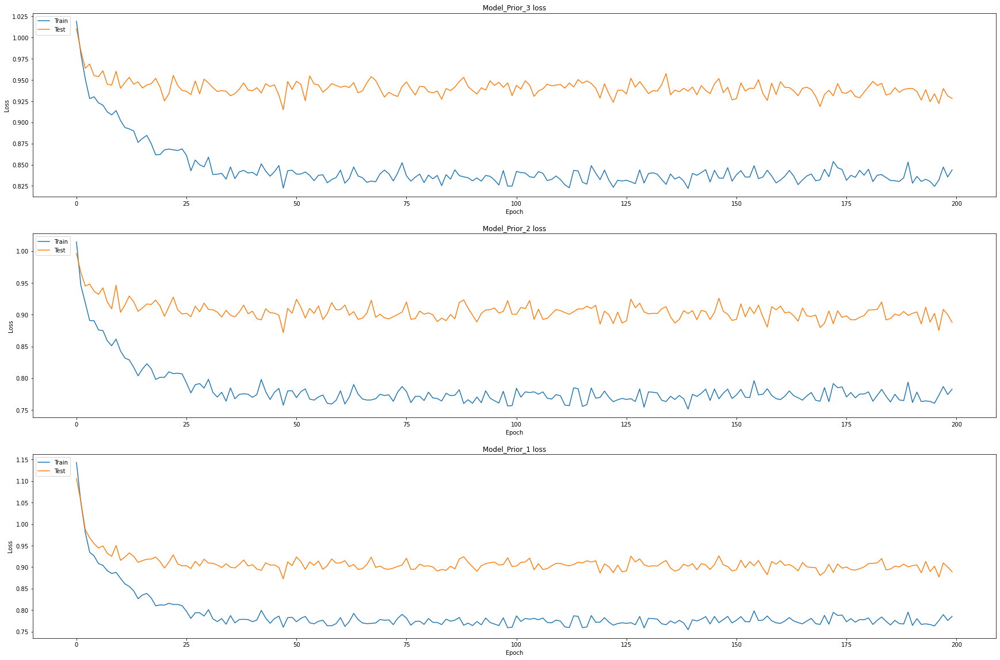

In [18]:
plt.figure(figsize=(30, 20))
plt.subplot(311)
plt.plot(history.history['model_3_loss'])
plt.plot(history.history['val_model_3_loss'])
plt.title('Model_Prior_3 loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(312)
plt.plot(history.history['model_2_loss'])
plt.plot(history.history['val_model_2_loss'])
plt.title('Model_Prior_2 loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.subplot(313)
plt.plot(history.history['model_1_loss'])
plt.plot(history.history['val_model_1_loss'])
plt.title('Model_Prior_1 loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# plt.subplot(311)
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('loss')
# plt.ylabel('Loss')
# plt.xlabel('Epoch')
# plt.legend(['Train', 'Test'], loc='upper left')

plt.savefig(HOME_DIR+'/plots/'+'training_loss_IOU_'+MODEL_DESC+'.png')

# Model Evaluation

In [19]:
""" MOdel Evaluation """
from keras.models import load_model
test_dataset = Dataset(PATH_TO_INPUT,
                       status = 'test',
                classes = Defined_CLASSES,
                 augmentation = validation_augmentation(),
                preprocessing = get_preprocessing(preprocess_input),
                
    )

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)
loading = True
if (loading== True):
    model.load_weights(PATH_TO_SAVE_MODEL+MODEL_DESC+'.h5')


scores = model.evaluate_generator(test_dataloader)
print('__model_3__:\n')
print("model_3_Loss: {:.5}".format(scores[1]))
print("model_3 mean iou_score: {:.5}".format(scores[4]))
print("model_3 mean f1_score: {:.5}".format(scores[5]))
print("model_3 mean precesion: {:.5}".format(scores[6]))
print("model_3 mean recall: {:.5}".format(scores[7]))
                   
print('__model_2__:\n')                  
print("model_2_Loss: {:.5}".format(scores[2]))                   
print("model_2 mean iou_score: {:.5}".format(scores[8]))
print("model_2 mean f1_score: {:.5}".format(scores[9]))
print("model_2 mean precesion: {:.5}".format(scores[10]))
print("model_2 mean recall: {:.5}".format(scores[11]))

print('__model_1__:\n')
print("model_1_Loss: {:.5}".format(scores[3]))
print("model_1 mean iou_score: {:.5}".format(scores[12]))
print("model_1 mean f1_score: {:.5}".format(scores[13]))
print("model_1 mean precesion: {:.5}".format(scores[14]))
print("model_1 mean recall: {:.5}".format(scores[15]))

# print('__model__:\n')
# print("Loss: {:.5}".format(scores[0]))
# print("mean iou_score: {:.5}".format(scores[1]))
# print("mean f1_score: {:.5}".format(scores[2]))

231
77
78
__model_3__:

model_3_Loss: 0.90241
model_3 mean iou_score: 0.46947
model_3 mean f1_score: 0.51096
model_3 mean precesion: 0.62548
model_3 mean recall: 0.75308
__model_2__:

model_2_Loss: 0.84851
model_2 mean iou_score: 0.53468
model_2 mean f1_score: 0.58524
model_2 mean precesion: 0.64965
model_2 mean recall: 0.8196
__model_1__:

model_1_Loss: 0.85086
model_1 mean iou_score: 0.53763
model_1 mean f1_score: 0.58768
model_1 mean precesion: 0.6556
model_1 mean recall: 0.81785


(1, 1, 512, 512, 1)
1YBBHAHIC


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


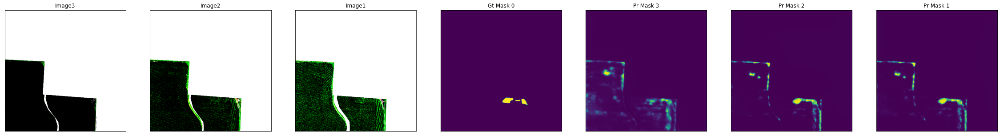

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
KRCZYQMUT


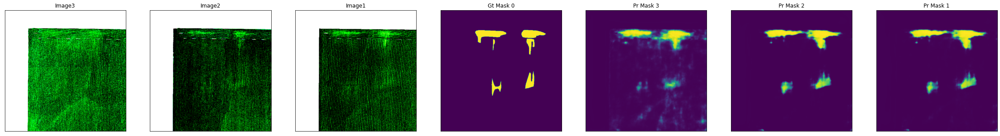

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
P6Z1D4II6


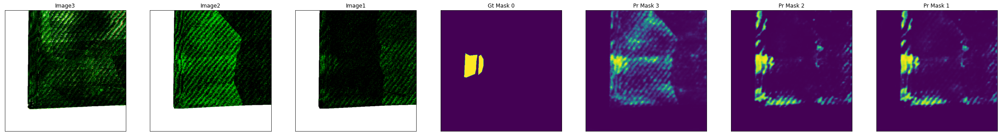

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
34VURFGJY


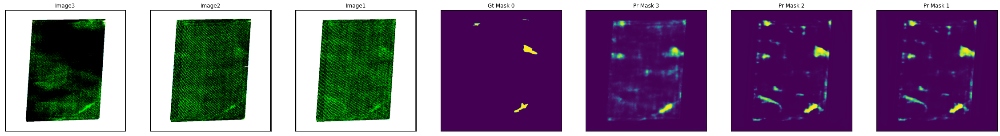

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
W3JYY6WMI


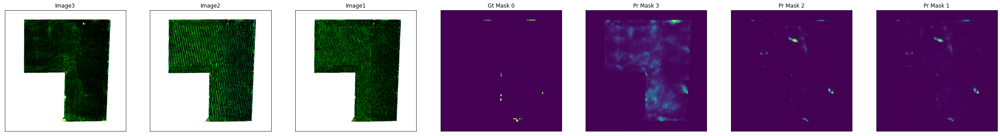

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
1GYFAWLYU


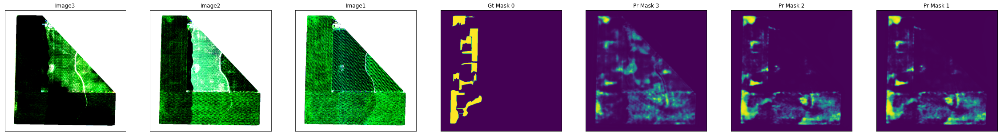

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
P17EGB63M


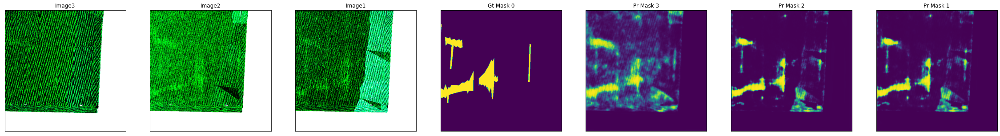

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
WZ2ECYMQT


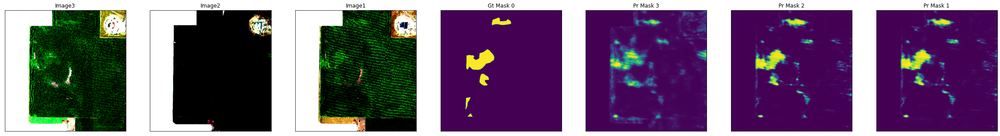

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
FJFFLYRLD


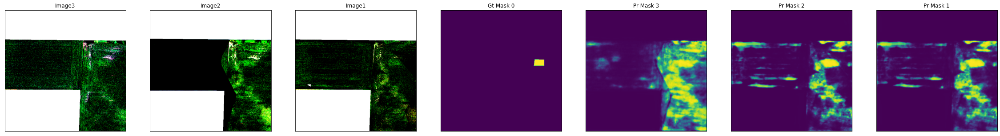

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
AMBEDAYEG


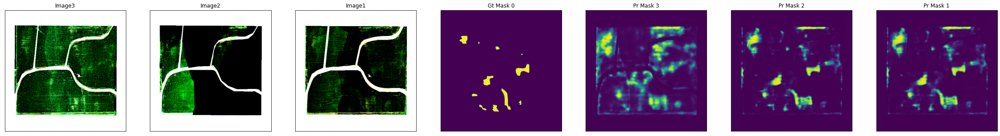

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
ABFZ34386


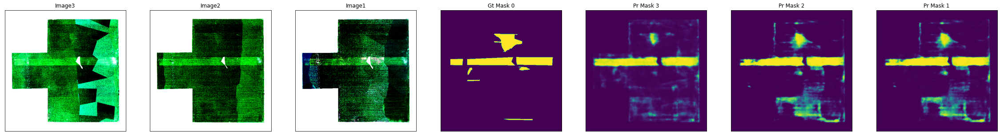

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
U2AVGC8PH


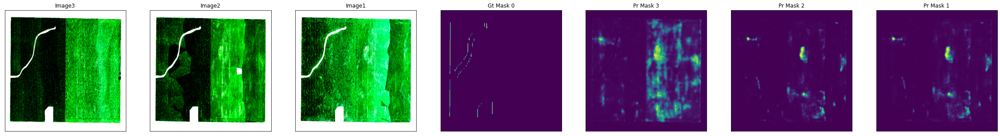

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
B1HX364VH


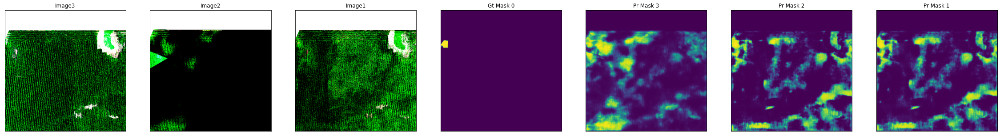

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
XLV9P2UZC


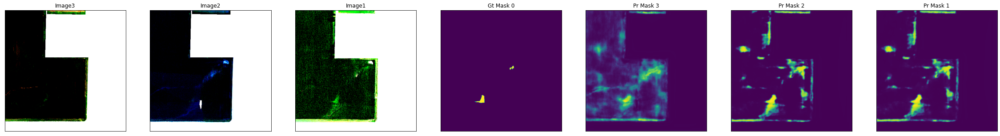

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
3W3U46A4H


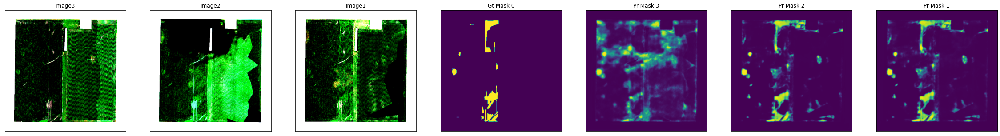

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
687MGJ32E


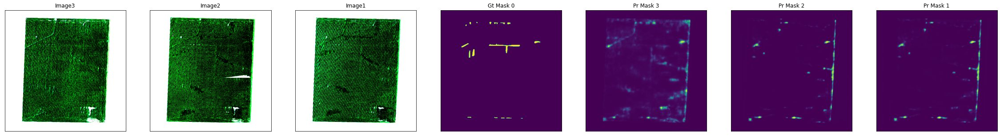

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
KV8M4ZRU7


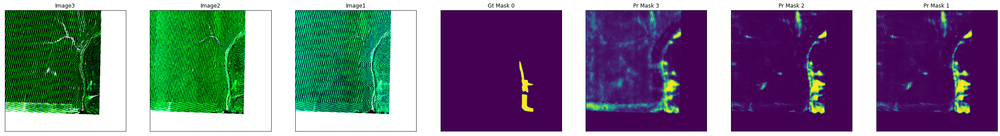

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
CIXWJDV9J


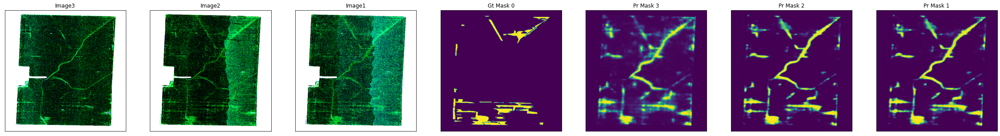

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
WAII8IL3P


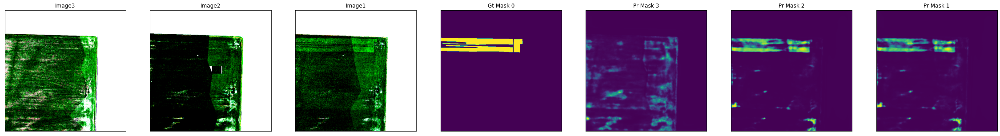

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
KRTJ6MC17


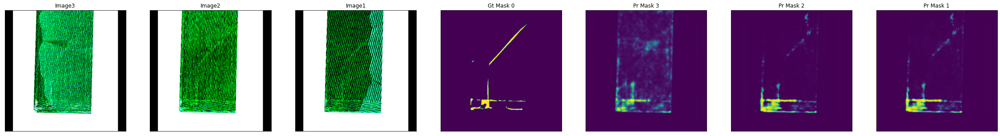

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
Q61ULEBRW


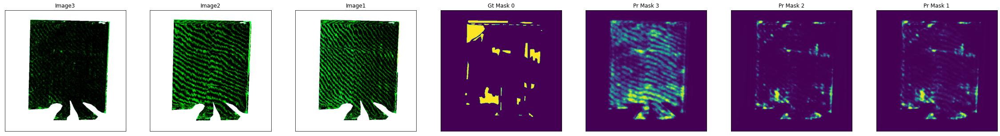

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
B3TXLETPY


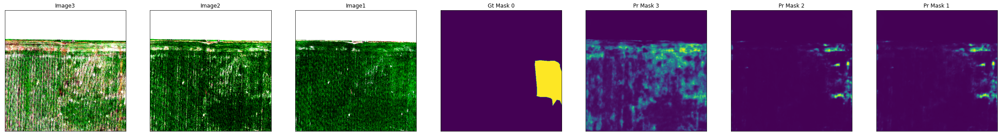

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
B43EY2AUG


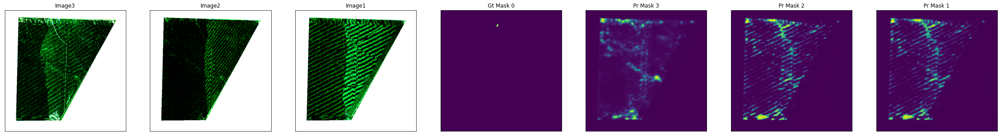

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
WYNM7ZW32


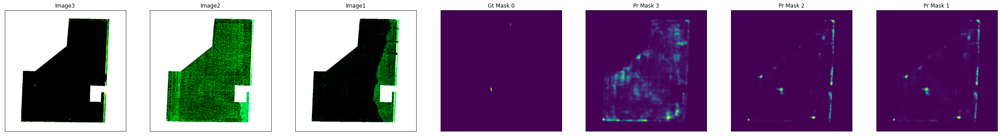

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
ALD9TECXR


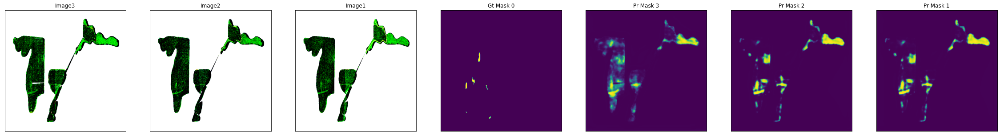

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
8MA4DX1P2


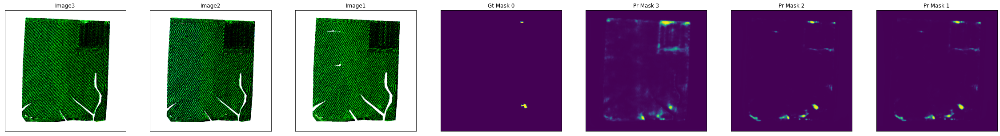

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 512, 512, 1)
Y7YQ33CTY


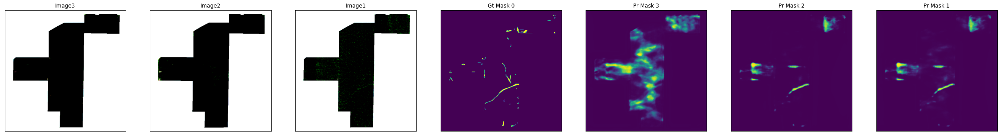

In [20]:
Save_PATH =HOME_DIR+'Dataset/predictions/'+MODEL_DESC+'/'

for i in range(0,27):
    
    image1, image2, image3,gt_mask, boundary_mask,flight_code = test_dataset[i]
    
    if MODEL_NAME == '_Nine_W_1_1_CONV' or MODEL_NAME == '_Nine_WO_1_1_CONV':
        image = np.concatenate((image1, image2, image3), axis = 2)
        image = np.expand_dims(image, axis=0)
        pr_mask = model.predict(image)
        print(flight_code)
        visualize(
            save_status = False,
            save_path = Save_PATH,
            flight_code = flight_code,
            image1 = image1.squeeze(),
            image2 = image2.squeeze(),
            image3 = image3.squeeze(),
            gt_mask_0=gt_mask[...,0].squeeze(),
            pr_mask_0=pr_mask[...,0].squeeze(),
        ) 
    if MODEL_NAME == '_PRE_LSTM' or MODEL_NAME == '_POST_LSTM':
        image = np.stack((image3, image2, image1), axis = 0)
        image = np.expand_dims(image, axis=0)
        pr_mask3,pr_mask2, pr_mask1 = model.predict(image)
#         pr_mask3 = np.array([(pr_mask3 >= 0.5)])
#         pr_mask2 = np.array([(pr_mask2 >= 0.5)])
#         pr_mask1 = np.array([(pr_mask1 >= 0.5)])
        print(pr_mask3.shape)
        print(flight_code)
        visualize(
            save_status = False,
            save_path = Save_PATH,
            flight_code = flight_code,
            image3 = image3.squeeze(),
            image2 = image2.squeeze(),
            image1 = image1.squeeze(),
            gt_mask_0=gt_mask[...,0].squeeze(),
            pr_mask_3=pr_mask3[...].squeeze(),
            pr_mask_2=pr_mask2[...].squeeze(),
#             pr_mask_sub=pr_subtract[...].squeeze(),
            pr_mask_1=pr_mask1[...].squeeze(),
        )
    else:
        image1 = np.expand_dims(image1, axis=0)
        image2 = np.expand_dims(image2, axis=0)
        image3 = np.expand_dims(image3, axis=0)
        pr_mask3,pr_mask2, pr_mask1 = model.predict([image1,image2,image3])
        print(flight_code)
        visualize(
            save_status = False,
            save_path = Save_PATH,
            flight_code = flight_code,
            image1 = image1.squeeze(),
            image2 = image2.squeeze(),
            image3 = image3.squeeze(),
            #image_0=denormalize(image.squeeze()),
            gt_mask_0=gt_mask[...,0].squeeze(),
            pr_mask1=pr_mask1[...,0].squeeze(),
            pr_mask2=pr_mask2[...,0].squeeze(),
            pr_mask3=pr_mask3[...,0].squeeze(),
        ) 

        
